# Importamos las utilidades de `utils.py`


In [1]:
from _utils import *

# Obtenemos la info de los JSON


In [2]:
import json

cryptocurrencys = dict()
portfolios = dict()

with open("../../data/json/coinmarket/cryptos.json") as f:
    cryptocurrencys = json.load(f)
    
with open("../../data/json/coinmarket/portfolios.json") as f:
    portfolios = json.load(f)

# Creacion de relaciones entre nodos

In [3]:
color_exchange = generate_rgb()  # genera color aleatorio para el exchange
color_crypto = generate_rgb()  # genera color aleatorio para la crypto
color_portfolio = generate_rgb()  # genera color aleatorio para el portfolio

## Ahora creamos las relaciones que hay entre exchange y crypto

In [4]:
# lista de colores para la ralacion
colors_exchange_cryptos = []

In [5]:
exchanges_crypto_edges: list[tuple] = [] # lista de tuplas (crypto, exchange)
set_crypto_names = set() # conjunto de nombres de cryptos

# se obtienen los nombres de las cryptos y se crean las aristas entre las cryptos y los exchanges
for category in cryptocurrencys:
    # se obtienen las cryptos de la categoria
    cryptos: list[dict] = cryptocurrencys[category]["coins"]
    # se recorren las cryptos
    for crypto in cryptos:
        # se añade el nombre de la crypto al conjunto
        set_crypto_names.add(crypto["symbol"])
        # se recorren los exchanges de la crypto
        for exchange in crypto["exchanges"]["data"]:
            # se añade la arista entre la crypto y el exchange
            exchanges_crypto_edges.append((crypto["symbol"], exchange["name"]))

In [6]:
len(exchanges_crypto_edges)

13669

In [7]:
len(set_crypto_names)

1031

## Ahora creamos las relaciones que hay entre Portfolios y cryptos

In [8]:
colors_portoflios_cryptos = [] # lista de colores

In [9]:
portfolios_crypto_edges: list[tuple] = []  # lista de tuplas (crypto, exchange)
crypto_names = set()  # conjunto de nombres de cryptos

# se obtienen los nombres de las cryptos y se crean las aristas entre las cryptos y los exchanges
for portfolio in portfolios:
    # se obtienen las cryptos de la categoria
    cryptos: list[dict] = portfolios[portfolio]
    # se recorren las cryptos
    for crypto in cryptos:
        # se añade la arista entre la crypto y el exchange
        portfolios_crypto_edges.append((crypto["symbol"], portfolio))

In [10]:
len(portfolios_crypto_edges)

292

# Graficamos los modelos logicos


## Modelo logico de Cryptomonedas con Exchanges

In [25]:
G = nx.DiGraph() # se crea el grafo

In [26]:
G.add_edges_from(exchanges_crypto_edges) # se añaden las aristas al grafo

In [27]:
nodes_name = list(G.nodes.keys())  # se obtienen los nombres de todos los nodos

# se obtienen los colores de los nodos en base a si son cryptos o exchanges
colors_exchange_cryptos: list[str] = list(map(lambda crypto: color_crypto if (crypto in set_crypto_names) else color_exchange, nodes_name))

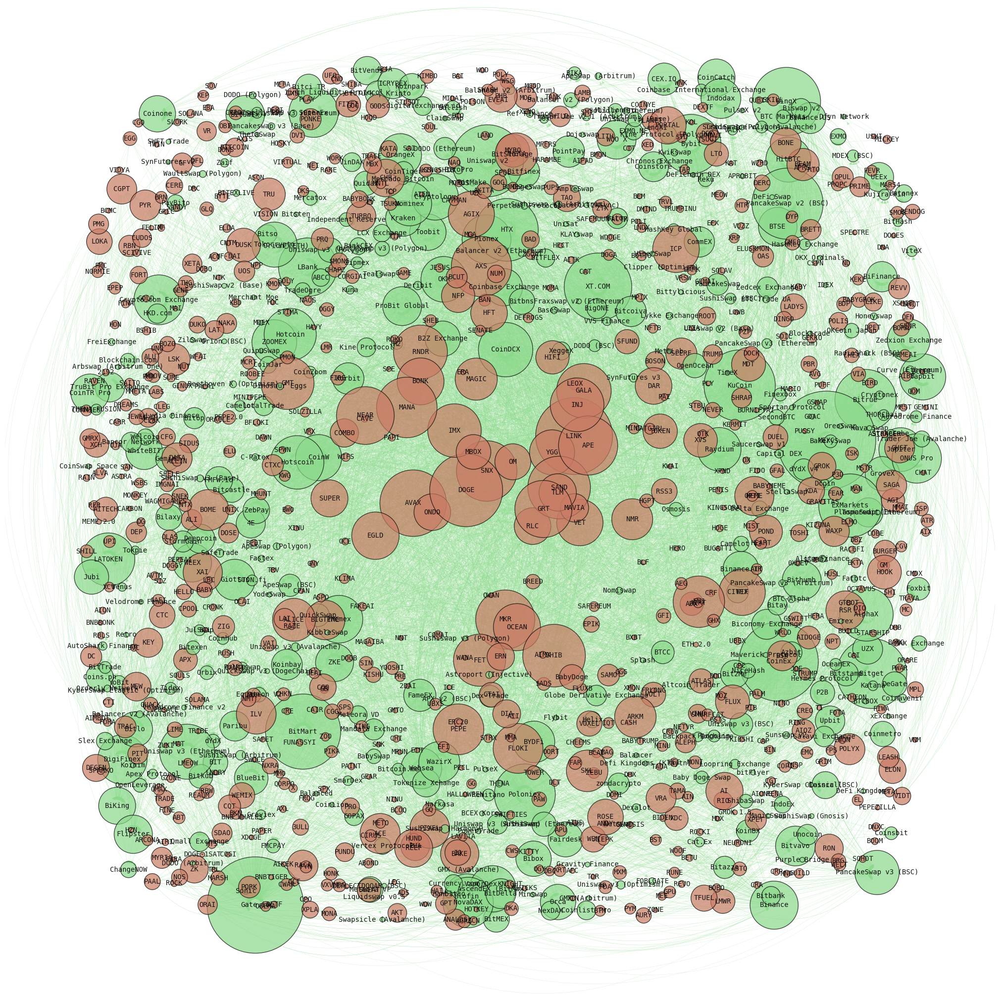

In [30]:
show_graph(
    G=G,
    colors=colors_exchange_cryptos,
    edgelists=[(exchanges_crypto_edges, color_exchange)]
)

## Modelo logico de Wallets con Cryptomonedas

In [15]:
G = nx.DiGraph()

In [16]:
G.add_edges_from(portfolios_crypto_edges) # se añaden las aristas al grafo

In [17]:
nodes_name = list(G.nodes.keys())  # se obtienen los nombres de todos los nodos

# se obtienen los colores de los nodos en base a si son cryptos o exchanges
colors_portfolios_cryptos: list[str] = list(map(lambda crypto: color_crypto if (crypto in set_crypto_names) else color_portfolio, nodes_name))

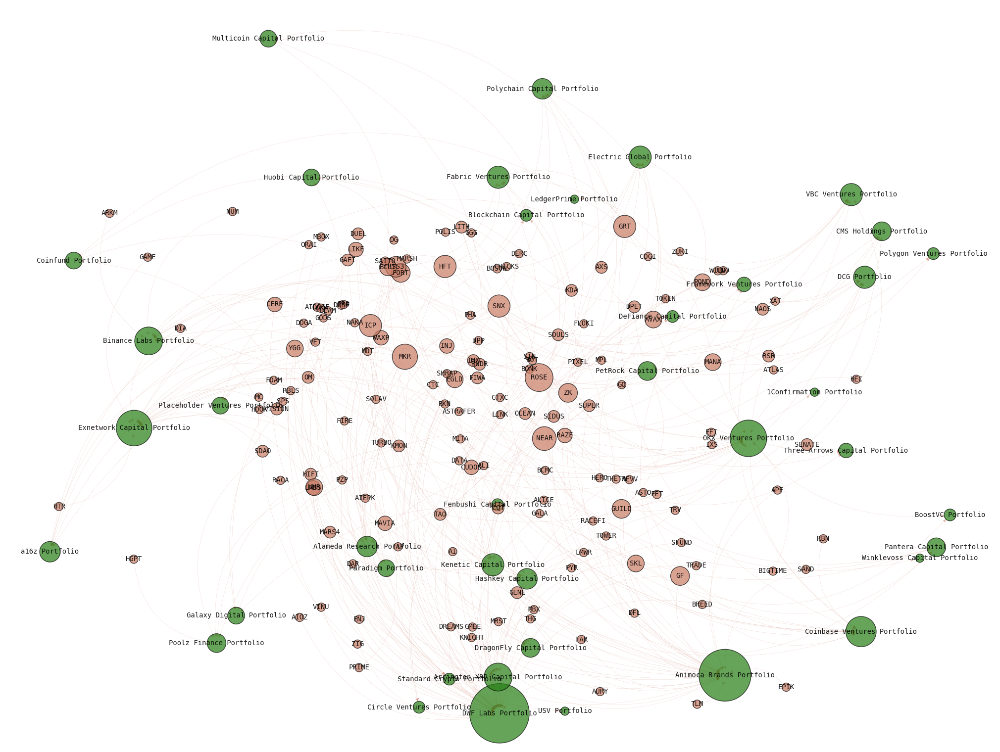

In [18]:
show_graph(
    G=G,
    figure_size=(20,15),
    colors=colors_portfolios_cryptos,
    k_spring_layout=1,
    node_size=150,
    edgelists=[(portfolios_crypto_edges,color_crypto)]
)

In [ ]:
# Show Portfolios with more cryptos
sorted(G.degree, key=lambda x: x[1], reverse=True) # type: ignore

In [ ]:
#Show how many times appears a crypto in the portfolios
dict_crypto = dict()
for crypto in set_crypto_names:
    dict_crypto[crypto] = 0
for edge in G.edges:
    dict_crypto[edge[0]] += 1
sorted(dict_crypto.items(), key=lambda x: x[1], reverse=True)

## Modelo logico de Portfolios con Cryptomonedas y Exchanges

In [21]:
G = nx.Graph()

In [22]:
G.add_edges_from(exchanges_crypto_edges)  # se añaden las aristas al grafo
G.add_edges_from(portfolios_crypto_edges)  # se añaden las aristas al grafo

In [23]:
nodes_name = list(G.nodes.keys())  # se obtienen los nombres de todos los nodos

# se obtienen los colores de los nodos en base a si son cryptos o exchanges
colors_portfolios_cryptos: list[str] = []

for node in nodes_name:
    if node in set_crypto_names:
        colors_portfolios_cryptos.append(color_crypto)
    elif node in portfolios:
        colors_portfolios_cryptos.append(color_portfolio)
    else:
        colors_portfolios_cryptos.append(color_exchange)

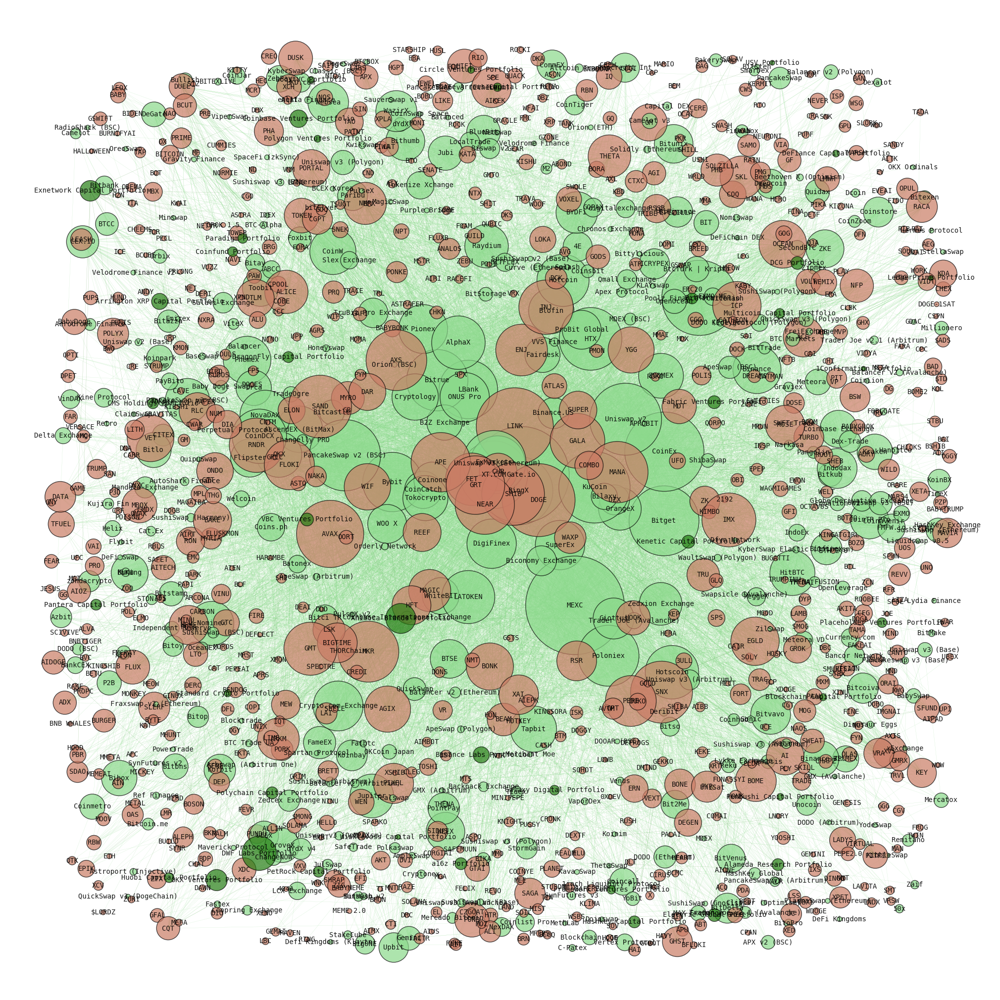

In [24]:
show_graph(
    G=G,
    colors=colors_portfolios_cryptos,
    scale=50,
    edgelists=[
        (portfolios_crypto_edges, color_portfolio),
        (exchanges_crypto_edges, color_exchange),
    ],
)